[(87, 136, 23)]
[47, 0] a
[162, 0] a
[197, 0] a
[218.22688779594546, 150.02417759322606] a
[247.14920055139214, 87.0418461340075] a
[21.662712006442906, 205.8947680298221] a
[164.78243099004928, 227.61281529081882] a
[136.42411405396322, 222.81942249929685] a
[-98.8103106365493, 90.45109670018651] a
[-2.3178899725301276, 106.84339428429432] a
[101.4702105605304, -1.7682759438647586] a
[84.64413265685883, -56.537532167399014] a
[-1.6253350524363281, 74.05801271214901] a
[76.19405714516101, 207.50263158129852] a
[197.11799292730427, 98.88320398059724] b
No vertex was added!
No vertex was added!
No vertex was added!
No vertex was added!
No vertex was added!
No vertex was added!
No vertex was added!
No vertex was added!
[<vertex.VertexDescendant object at 0x000001E5ED020FC8>, -0.0] aaaaaaaaaaaa


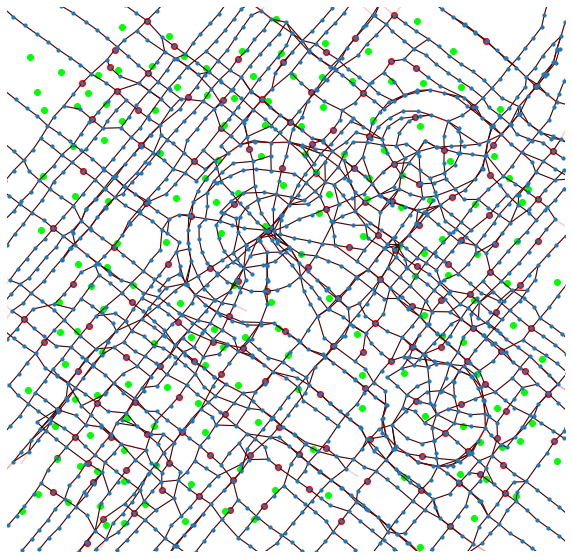

In [28]:
%matplotlib inline
from matplotlib import pyplot as plt

import networkx as nx
import numpy as np
import os
import cv2
import math
import random
import bisect
import copy
from scipy.spatial import Voronoi, voronoi_plot_2d
from itertools import accumulate
from copy import deepcopy
from itertools import accumulate, combinations

from randomScatter import RandomScatter
from direction import Direction
from vertex import VertexBase, VertexOrigin, VertexLayer

def intersection(x1,x2,y1,y2,r1,r2):
    d = math.sqrt((x1 - x2) ** 2 + (y1 - y2) ** 2)
    if d < r1 + r2 + 20:
        return True
    else:
        return False

num_radial_centres = random.randint(1,3)
# print(num_radial_centres)

width = 200
height = 200
buffer = 20

circles = []

for i in range(num_radial_centres):    
    for i in range(1000):
        radius = random.randint(20, 50)
        cen_x = random.randint(buffer+radius,width-buffer-radius)
        cen_y = random.randint(buffer+radius,height-buffer-radius)
        if not any(map(lambda circle: intersection(cen_x, circle[0],cen_y, circle[1],radius, circle[2]), circles)):
            circles.append((cen_x, cen_y, radius))
            break

# print(circles)
# img = np.ones((width,height))*255
img = np.zeros((width,height))
for circle in circles:
#     cv2.circle(img, (circle[0],circle[1]),circle[2],(0),cv2.FILLED)
    cv2.circle(img, (circle[0],circle[1]),circle[2],(255),cv2.FILLED)
# plt.imshow(img,cmap='Greys')
cv2.imwrite("scatter_rate.jpg",img)

circles = []
for i in range(num_radial_centres):    
    for i in range(1000):
        radius = random.randint(20, 50)
        cen_x = random.randint(buffer+radius,width-buffer-radius)
        cen_y = random.randint(buffer+radius,height-buffer-radius)
        if not any(map(lambda circle: intersection(cen_x, circle[0],cen_y, circle[1],radius, circle[2]), circles)):
            circles.append((cen_x, cen_y, radius))
            break

num = 1
for circle in circles:
    img2 = np.ones((width,height))*255
    cv2.circle(img2, (circle[0],circle[1]),circle[2],(0),cv2.FILLED)
    cv2.imwrite('circle'+str(num)+".jpg",img2)
    num += 1
    
kernel = np.ones((50,50),np.float32)/(50**2)
dst = cv2.filter2D(img,-1,kernel)**2/255

# plt.imshow(dst,cmap='Greys')
cv2.imwrite("scatter_rate_blurred.jpg",dst)

if __name__ =="__main__":

    ERROR_MESSAGE = '----------------------'
    IMAGE_INPUT_PATH = 'scatter_rate_blurred.jpg'
    IMAGE_OUTPUT_PATH = './image_output/'
    ROADMAP_RECTANGLE = ['./image_input/roadMapRectangle_00.jpg']
    ROADMAP_CIRCLE = ['circle1.jpg', 'circle2.jpg', 'circle3.jpg']

    random.shuffle(ROADMAP_CIRCLE)

    if not os.path.exists(IMAGE_OUTPUT_PATH):
        os.mkdir(IMAGE_OUTPUT_PATH)

    randomScatterInstance = RandomScatter(IMAGE_INPUT_PATH, 200, 0, reverse=True, squared=True)
    randomScatterInstance.readImage()
    randomScatterInstance.randomDots()
    randomScatterInstance.makePoints()

    #run improvePoints twice to refine points' locations
    randomScatterInstance.improvePoints(randomScatterInstance.points)
    _, graph, points = randomScatterInstance.improvePoints(randomScatterInstance.improvedPoints) * 1
    print(points[0], 'b')
    directionInstance = Direction(ROADMAP_RECTANGLE, ROADMAP_CIRCLE)

    vertexLayertInstance = VertexLayer(randomScatterInstance, directionInstance)
    
#     plt.show()
    fig = plt.figure(figsize=(10,10))
    ax = plt.gca()
    ax.set_xlim(left=0, right=randomScatterInstance.shape[1])
    ax.set_ylim(top=200, bottom=0)#randomScatterInstance.shape[0])
    plt.figure(1,figsize=(10,10)) 
    
    verts = []
    vertexlist={}
    vertexdem = {}
    c=0
    adjdict={}
    for i in range(20):
        vertexLayertInstance.getNextVertices()
        vertexLayertInstance.mergeNextVertices(5)
        vertexLayertInstance.mergeToAll(3)
        if len(vertexLayertInstance.verticesNext)<=3:
            vertexLayertInstance.changeNextVertices()
            break
        vertexLayertInstance.plotLines(vertexLayertInstance.verticesNext, True)
        for i in vertexLayertInstance.verticesNext:
            if tuple(i.position) not in vertexlist:
                vertexlist[tuple(i.position)] = i.index
                verts.append(i.index)
                vertexdem[tuple(i.position)] = i.dem
#                 c+=1
            
        for i in vertexLayertInstance.verticesNext:
            for j in i.comesFrom:
                if tuple(i.position) not in vertexlist:
                    vertexlist[tuple(i.position)] = i.index
                    verts.append(i.index)
                    vertexdem[tuple(i.position)] = i.dem
#                     c+=1

                if tuple(j[0].position) in vertexlist:
                    if vertexlist[tuple(j[0].position)] in adjdict:
                        adjdict[vertexlist[tuple(j[0].position)]].update({vertexlist[tuple(i.position)]:{'weight':j[0].getDistance(i)}})
                    else:
                        adjdict[vertexlist[tuple(j[0].position)]] = {vertexlist[tuple(i.position)]:{'weight':j[0].getDistance(i)}}
                else:
                    vertexlist[tuple(j[0].position)] = j[0].index
                    verts.append(j[0].index)
                    vertexdem[tuple(j[0].position)] = j[0].dem
#                     c+=1
                    if vertexlist[tuple(j[0].position)] in adjdict:
                        adjdict[vertexlist[tuple(j[0].position)]].update({vertexlist[tuple(i.position)]:{'weight':j[0].getDistance(i)}})
                    else:
                        adjdict[vertexlist[tuple(j[0].position)]] = {vertexlist[tuple(i.position)]:{'weight':j[0].getDistance(i)}}

            for j in i.goesTo:
                if tuple(j[0].position) not in vertexlist:
                    vertexlist[tuple(j[0].position)] = j[0].index
                    verts.append(j[0].index)
                    vertexdem[tuple(j[0].position)] = j[0].dem
#                     c+=1

                if tuple(i.position) in vertexlist:
                    if vertexlist[tuple(i.position)] in adjdict:
                        adjdict[vertexlist[tuple(i.position)]].update({vertexlist[tuple(j[0].position)]:{'weight':i.getDistance(j[0])}})
                    else:
                        adjdict[vertexlist[tuple(i.position)]] = {vertexlist[tuple(j[0].position)]:{'weight':i.getDistance(j[0])}}
                else:
                    vertexlist[tuple(i.position)] = i.index
                    verts.append(i.index)
                    vertexdem[tuple(i.position)] = i.dem
#                     c+=1
                    if vertexlist[tuple(i.position)] in adjdict:
                        adjdict[vertexlist[tuple(i.position)]].update({vertexlist[tuple(j[0].position)]:{'weight':i.getDistance(j[0])}})
                    else:
                        adjdict[vertexlist[tuple(i.position)]] = {vertexlist[tuple(j[0].position)]:{'weight':i.getDistance(j[0])}}

        vertexLayertInstance.changeNextVertices()
    
    for i in vertexLayertInstance.verticesAll:
        if tuple(i.position) not in vertexlist:
            vertexlist[tuple(i.position)]=i.index
#             c+=1

    vertexlistinv = {v: k for k, v in vertexlist.items()}
    vertexLayertInstance.plotVertices(vertexLayertInstance.verticesOrigin, alpha = 1.0)

    x_coor = []
    y_coor = []
    for ver in points:
        x_coor.append(ver[0])
        y_coor.append(ver[1])
    plt.scatter(x_coor, y_coor, c='#00ff00', alpha = 1.0)

vertexpos={}
for k,v in vertexlistinv.items():
    pos=v
    vertexpos[k] = pos[::-1]

G = nx.Graph(adjdict)
G.remove_edges_from(nx.selfloop_edges(G))
unneeded = []
for n in G.nodes:
    if len(list(G.neighbors(n))) == 1:
        nbrs = list(G.neighbors(n))
        if len(list(G.neighbors(nbrs[0]))) > 2:
            unneeded.append(n)
# print(unneeded)
for i in range(len(unneeded)):
    G.remove_node(unneeded[i])

nx.draw(G, vertexpos, node_size=10, font_size=8)
plt.show()

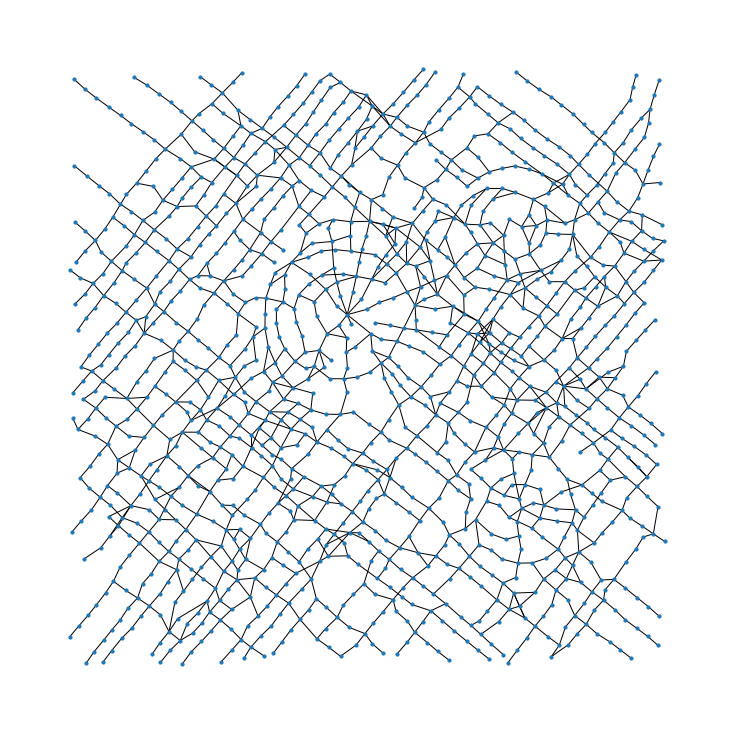

In [30]:
T = deepcopy(G)

combs = list(combinations(G.nodes(), 2))
nodes_to_remove = []
edges_to_add = []
for n1,n2 in combs:
#     print(vertexpos[n1], vertexpos[n2])
    if n1 in T.nodes() and n2 in T.nodes():
        temp = math.sqrt((vertexpos[n1][0] - vertexpos[n2][0]) ** 2.0 + (vertexpos[n1][1] - vertexpos[n2][1]) ** 2.0)
        if temp < 3:# and n1 not in T.neighbors(n2):
            for n in T.neighbors(n1):
                edges_to_add.append((n2, n))
            if n1 not in nodes_to_remove:
                nodes_to_remove.append(n1)

T.add_edges_from(edges_to_add) 
for node in nodes_to_remove:
    T.remove_node(node)
T.remove_edges_from(nx.selfloop_edges(T))
# print(len(T.edges()))
fig = plt.figure(figsize=(10,10))
nx.draw(T, vertexpos, node_size=10, font_size=8)
plt.show()

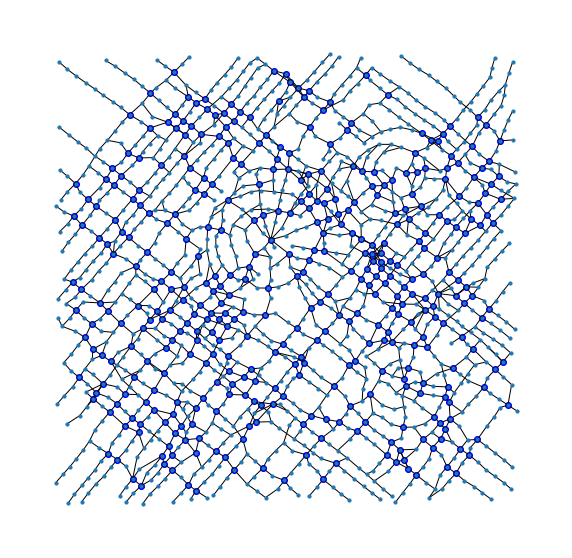

In [31]:
nw_points = []
for ver in T.nodes():
    if len(list(T.neighbors(ver))) >= 4:
        nw_points.append(ver)

nw_pts = deepcopy(nw_points)

plt.figure(1,figsize=(10,10)) 
x_co = []
y_co = []
for ver in nw_points:
    x_co.append(vertexpos[ver][0])
    y_co.append(vertexpos[ver][1])

plt.scatter(x_co, y_co, c='#0000ff', alpha = 1.0)
nx.draw(T, vertexpos, node_size=10, font_size=8)

582
469


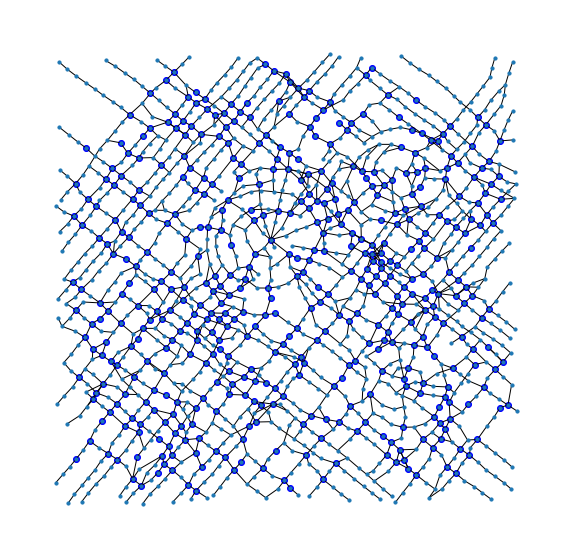

In [32]:
temps = []
for pt in points:
    nearest = 50000
    best_pt = None
    for nd in T.nodes():
        ver = vertexpos[nd]
        temp = math.sqrt(sum((px - qx) ** 2.0 for px, qx in zip(ver, pt)))

        key_v=vertexlist[ver[::-1]]
        if key_v in adjdict:
            deg=len(adjdict[key_v])
        else:
            deg=0.001
        vvv = (1/vertexdem[ver[::-1]])*(1/deg)*temp
        if vvv < nearest:
            best_pt = ver
            nearest = vvv
            
    temps.append(best_pt)

for el in nw_points:
    temps.append(vertexpos[el])

print(len(temps))
new_points = []
for el in temps:
    if el not in new_points:
        new_points.append(el)
print(len(new_points))
plt.figure(1,figsize=(10,10)) 
x_co = []
y_co = []
for ver in new_points:
    x_co.append(ver[0])
    y_co.append(ver[1])

plt.scatter(x_co, y_co, c='#0000ff', alpha = 1.0)

nx.draw(T, vertexpos, node_size=10, font_size=8)

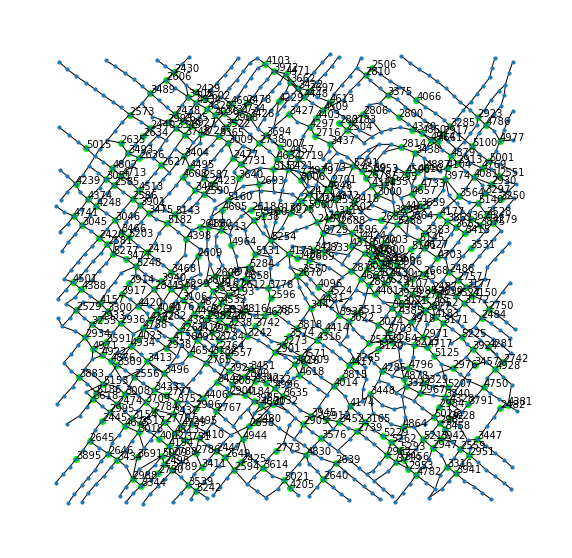

In [33]:
vertexposinv={v:k for (k,v) in vertexpos.items()}
labels = []
for pt in new_points:
#     print(pt)
    labels.append(vertexposinv[pt])
    
fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(x_co, y_co, c='#00ff00', alpha = 1.0)
for i, txt in enumerate(labels):
    ax.annotate(txt, (x_co[i], y_co[i]))
nx.draw(T, vertexpos, node_size=10, font_size=10)

In [43]:
visited = []
path_list = []

paths = []

for n1, n2 in combinations(new_points, 2):
    paths.append(nx.shortest_path(T, vertexposinv[n1], vertexposinv[n2]))

'''
for pts in new_points, split into pairs (preferably diametrically opposite)
try to grow shortest path between pairs, including 
'''
path_list = []

for pt in new_points:
    direction = (200-pt[0], 200-pt[1])
    nearest = 5000
    best_pt = None
    for ver in new_points:
        temp = math.sqrt((direction[0] - ver[0]) ** 2.0 + (direction[1] - ver[1]) ** 2.0)
        if temp < nearest:
            best_pt = ver
            nearest = temp
    path_list.append(nx.shortest_path(T,vertexposinv[pt],vertexposinv[best_pt]))

print(len(path_list))

removed = []
for i in range(len(path_list)):
    for j in range(i+1,len(path_list)):
        temp_1 = None
        temp_2 = None
        if len(path_list[i]) >= len(path_list[j]):
            temp_1 = path_list[i]
            temp_2 = path_list[j]
        else:
            temp_1 = path_list[j]
            temp_2 = path_list[i]
        if len(set(temp_1).intersection(set(temp_2))) >= 0.65*len(temp_2):
            if temp_2 not in removed:
                removed.append(temp_2)

print(len(removed))

for i in removed:
    path_list.remove(i)
    
print(len(path_list))

'''
look at all remaining stops
pick end node of path, iteratively connect to nearest stop until cannot find more

'''

469
435
34


'\nlook at all remaining stops\npick end node of path, iteratively connect to nearest stop until cannot find more\n\n'

In [44]:
covered = []
for path in path_list:
    for el in path:
#         print(vertexpos[el])
#         print(el)
        if el not in covered and vertexpos[el] in new_points:
            covered.append(el)
remaining = [vertexposinv[el] for el in new_points]
# print(remaining)
for pt in covered:
    remaining.remove(pt)
# temp = 0
print(remaining)
            

longest = []
for n1, n2 in combinations(remaining,2):
    pth = nx.shortest_path(T, n1, n2)
    if any(i in covered for i in pth) == False:
        if len(pth) >= len(longest):
            longest = pth

print(len(longest), longest)
    

[2528, 3678, 2551, 2985, 3316, 2790, 4318, 3945, 3457, 2559, 2951, 2984, 2482, 3791, 4501, 2478, 2606, 3816, 2716, 2773, 2425, 2933, 3917, 2788, 4032, 2447, 3451, 2636, 2635, 3531, 2757, 4177, 3906, 4730, 5101, 2784, 4002, 2777, 2764, 3883, 3591, 4398, 2419, 3640, 4605, 2618, 4261, 3000, 2678, 2913, 4370, 2800, 2864, 3018, 2498, 2513, 2581, 2585, 2594, 2608, 2640, 2734, 2739, 2750, 2767, 2789, 2905, 2930, 2934, 2947, 2962, 2609, 2613, 2627, 2639, 2899, 2649, 2938, 3051, 3177, 3250, 3255, 3297, 3405, 3413, 3422, 3425, 3426, 3452, 3404, 3349, 3383, 3517, 3571, 3655, 3719, 3751, 3656, 3522, 3925, 3941, 3861, 3910, 3952, 3923, 3942, 4060, 4136, 4150, 4036, 3458, 4282, 4300, 4320, 4381, 4388, 4424, 4385, 4471, 4500, 4513, 4589, 4534, 4610, 4696, 4613, 4713, 4741, 4786, 4796, 4860, 4864, 4876, 4878, 4922, 4914, 4928, 4973, 5007, 4971, 4996, 5060, 5026, 5087, 5100, 5167, 5140, 5203, 5215, 5186, 5240, 3456, 5295]
17 [2951, 2559, 3036, 3942, 2947, 5215, 2948, 3456, 3719, 3898, 4640, 4564, 3857,

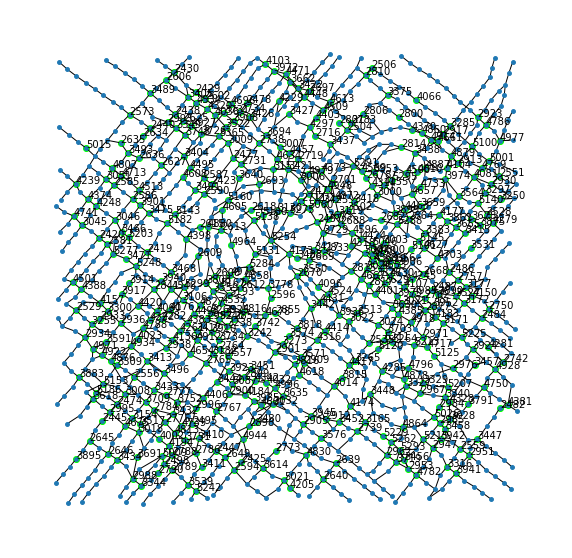

In [45]:
fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(x_co, y_co, c='#00ff00', alpha = 1.0)
for i, txt in enumerate(labels):
    ax.annotate(txt, (x_co[i], y_co[i]))
nx.draw(T, vertexpos, node_size=15, font_size=10)

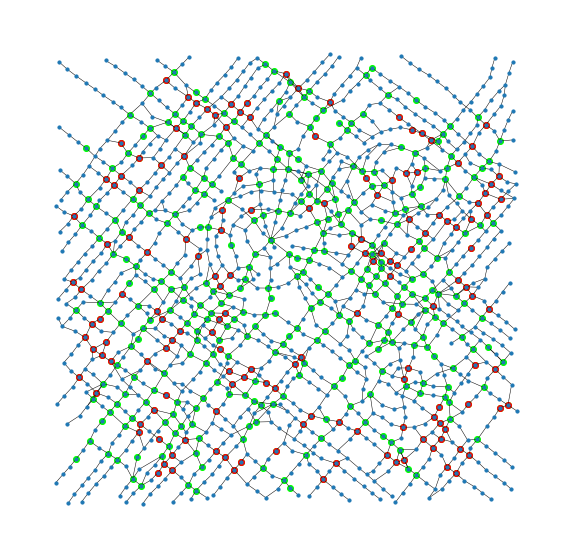

In [46]:
rem_x_co = []
rem_y_co = []
for ver in remaining:
    rem_x_co.append(vertexpos[ver][0])
    rem_y_co.append(vertexpos[ver][1])

plt.figure(figsize=(10,10))
plt.scatter(x_co, y_co, c='#00ff00', alpha = 1.0)
plt.scatter(rem_x_co, rem_y_co, c='#ff0000', alpha = 1.0)
nx.draw(T, vertexpos, node_size=10, font_size=8,width=0.5)

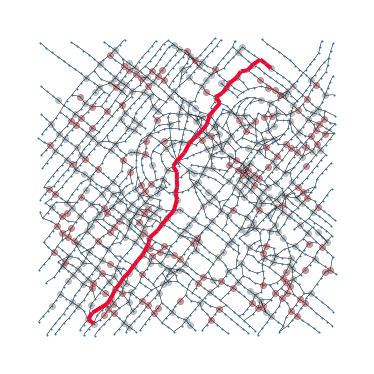

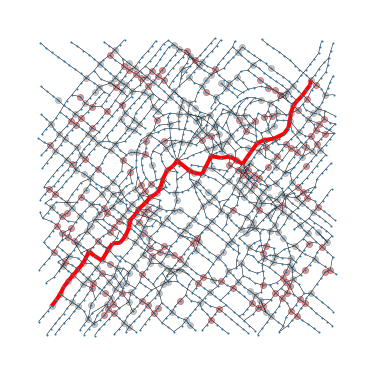

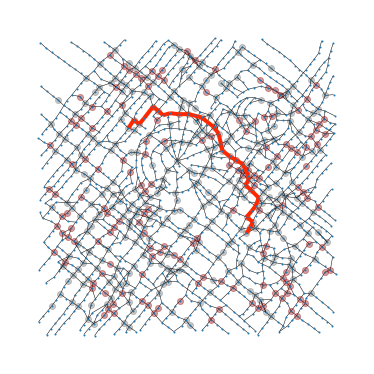

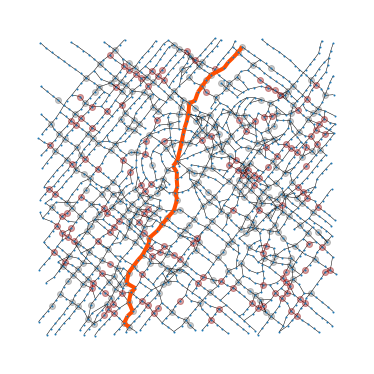

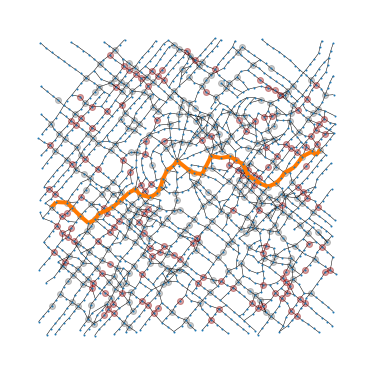

...

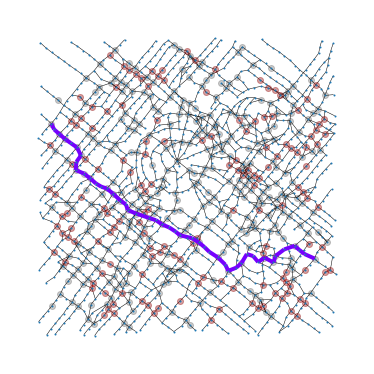

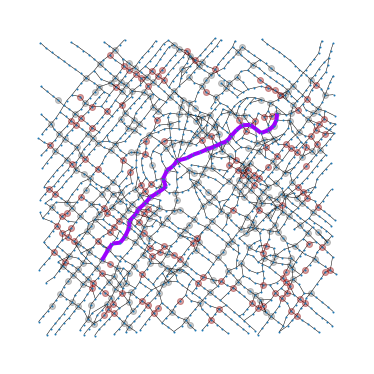

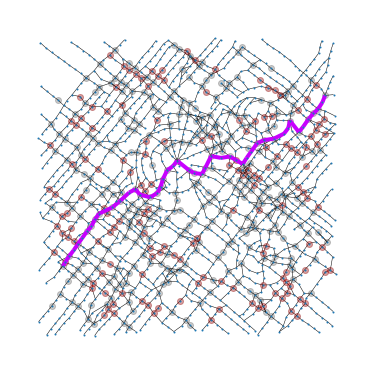

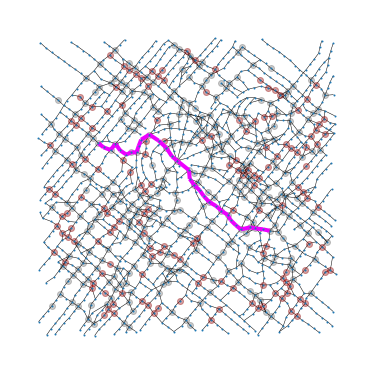

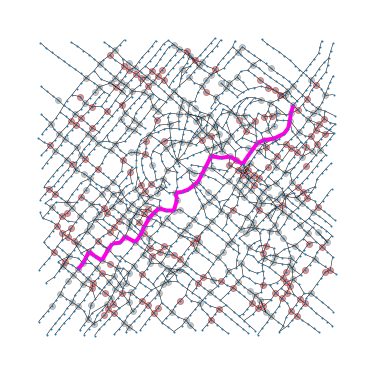

In [55]:
def get_cmap(n, name='hsv'):
    return plt.cm.get_cmap(name, n)

P = nx.Graph()
edges = []
for path in path_list:
    path_edges = [(path[n], path[n+1]) for n in range(len(path)-1)]
    P.add_nodes_from(path)
    P.add_edges_from(path_edges)
    edges.append(path_edges)

pos = nx.spring_layout(P)
colors = get_cmap(len(path_list))

linewidths = [2*i for i in range(len(path_list))]

cm = plt.get_cmap('gist_rainbow')
NUM_COLORS=len(edges)
for ctr, edgelist in enumerate(edges):
    plt.figure(figsize=(5,5))
    nx.draw(T, vertexpos, node_size=1, font_size=8, width=0.5)

    plt.scatter(x_co, y_co, c='#000000', alpha = 0.2)
    plt.scatter(rem_x_co, rem_y_co, c='#ff0000', alpha = 0.2)
    nx.draw_networkx_edges(P, pos=vertexpos, edgelist=edgelist, edge_color = cm(ctr/NUM_COLORS), width = 4 ,node_size= 1)
    plt.show()
# plt.show()
# plt.savefig('this.png')

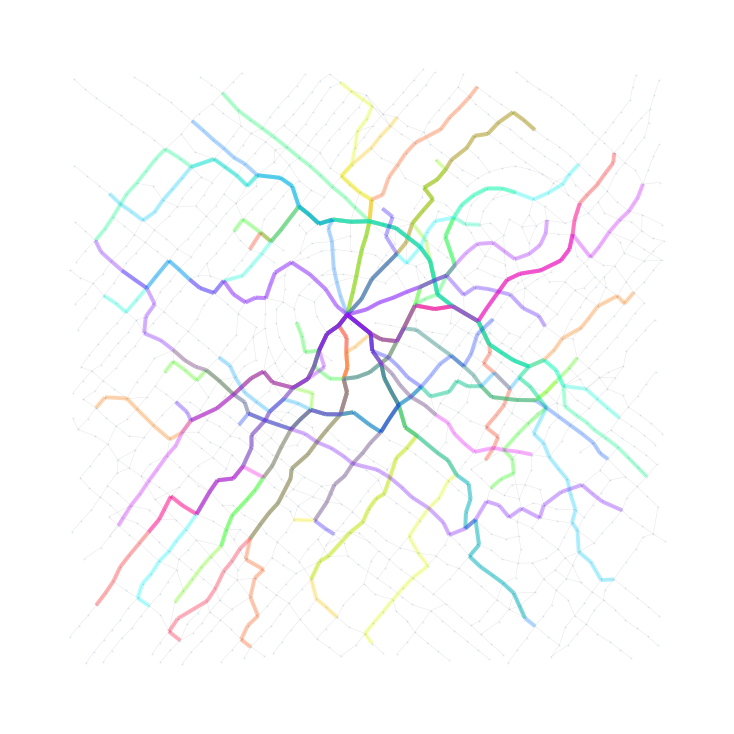

In [63]:
pos = nx.spring_layout(P)
colors = get_cmap(len(path_list))
linewidths = [2*i for i in range(len(path_list))]

plt.figure(figsize=(10,10))

nx.draw(T, vertexpos, node_size=1, font_size=8, alpha=0.1, width=0.5)

cm = plt.get_cmap('gist_rainbow')
NUM_COLORS=len(edges)
for ctr, edgelist in enumerate(edges):
    plt.scatter(x_co, y_co, c='#000000', alpha = 0.0)
    plt.scatter(rem_x_co, rem_y_co, c='#FFA500', alpha = 0.0)
    nx.draw_networkx_edges(P, pos=vertexpos, edgelist=edgelist, edge_color = cm(ctr/NUM_COLORS), alpha = 0.3, width = 4 ,node_size= 10)

plt.savefig('paths.png')
plt.show()

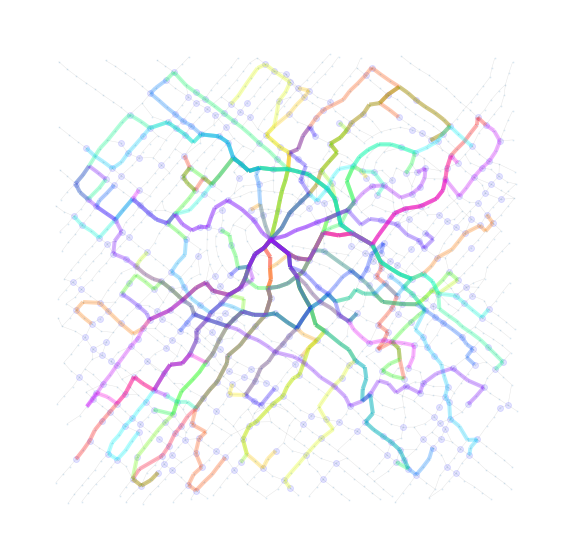

In [65]:
'''
path extension
find closest node to extend path
ensure that there are no loops
repeat until path cannot be extended (either everything in visited or no existing path)
'''

new_paths = deepcopy(path_list)
updated_paths = []
cov = []

# make visited

# vis = []

for path in new_paths:
    Q=deepcopy(T)
    possible = []
    Q.remove_edge(path[-1], path[-2])
    new = deepcopy(path)
    for pt in remaining:
        closest = pt
        if nx.has_path(Q, path[-1], pt):# and pt not in vis:
            temp = nx.shortest_path(Q, path[-1], pt)
            temp.pop(0)
            if any(i in temp for i in path) == False:
                possible.append(temp)
                cov.append(pt)
#                 vis.append(pt)
    if possible != []:
        possible.sort(key = len)
        extenx = possible[0]
#         print(len(extenx), 'a')
        new.extend(extenx)
#         updated_paths.append(path)
    possible = []
    
    Q.remove_edge(path[0], path[1])
    for pt in remaining:
        closest = pt
        if nx.has_path(Q, path[0], pt):# and pt not in vis:
            temp = nx.shortest_path(Q, pt, path[0])
            temp.pop(-1)
            if any(i in temp for i in path) == False:
                possible.append(temp)
                cov.append(pt)
#                 vis.append(pt)
    if possible != []:
        possible.sort(key = len)
        extenx = possible[0]
#         print(len(extenx), 'b')
        new = extenx + new
#         updated_paths.append(extenx)
#     else:
#         print('aaaaaaaaaaaaaaaaaaaa')
    if len(path) != len(new):
        updated_paths.append(new)

            
updated = new_paths[0]

Y = nx.Graph()
ejs = []
for path in updated_paths:
    ej = [(path[n], path[n+1]) for n in range(len(path)-1)]
    Y.add_nodes_from(path)
    Y.add_edges_from(ej)
    ejs.append(ej)

cm = plt.get_cmap('gist_rainbow')
NUM_COLORS=len(ejs)

plt.figure(figsize=(10,10))
plt.scatter(x_co, y_co, c='#0000ff', alpha = 0.1)
# nx.draw(T, vertexpos, node_size=10, font_size=8,width=0.5)
nx.draw(T, vertexpos, node_size=1, font_size=8, alpha=0.1, width=0.5)
    
for ctr, edgelist in enumerate(ejs):
    nx.draw_networkx_edges(Y, pos=vertexpos, edgelist=edgelist, edge_color = cm(ctr/NUM_COLORS), alpha = 0.3, width = 4 ,node_size= 10)
plt.show()

In [66]:
line_pool = {}
period = 10
pool = []
dist_id = []
for path in path_list:
    stops = []
    dists = []
    for p in range(len(path)):
        if vertexpos[path[p]] in new_points:
            stops.append(path[p])
            dists.append(p)
    dist_id.append(dists)
    pool.append(stops)

print(pool[0])
start = 6.0
for i in range(len(pool)):
    times = [start + t/50 for t in dist_id[i]]
    line_pool.update({tuple(pool[i]):(start, times)})


'''
Feasible paths
'''


[3344, 2988, 5009, 4194, 4813, 4739, 2996, 4406, 3444, 4557, 3242, 3742, 4678, 2596, 3778, 5254, 5275, 2711, 2471, 4373, 3437, 2504, 3783, 2806, 3375, 4066]


'\nFeasible paths\n'

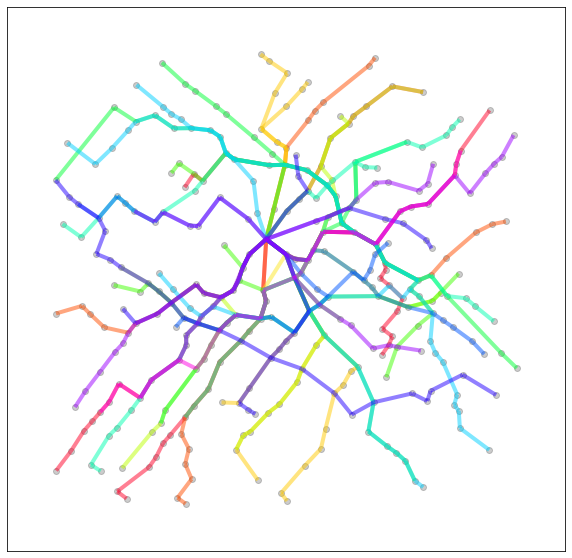

In [68]:
L = nx.Graph()
edjs = []

for line in line_pool.keys():
#     print(list(line))
    temp = list(line)
    edj = [(temp[n], temp[n+1]) for n in range(len(temp)-1)]
#     print(edj)
    L.add_nodes_from(path)
    L.add_edges_from(ej)
    edjs.append(edj)

cm = plt.get_cmap('gist_rainbow')
NUM_COLORS=len(edjs)

cov_x = []
cov_y = []
for ver in covered:
    cov_x.append(vertexpos[ver][0])
    cov_y.append(vertexpos[ver][1])

plt.figure(figsize=(10,10))
plt.scatter(cov_x, cov_y, c='#000000', alpha = 0.2)
    
for ctr, edgelist in enumerate(edjs):
    nx.draw_networkx_edges(L, pos=vertexpos, edgelist=edgelist, edge_color = cm(ctr//3*3.0/NUM_COLORS), alpha = 0.5, width = 4 ,node_size= 10)
plt.show()

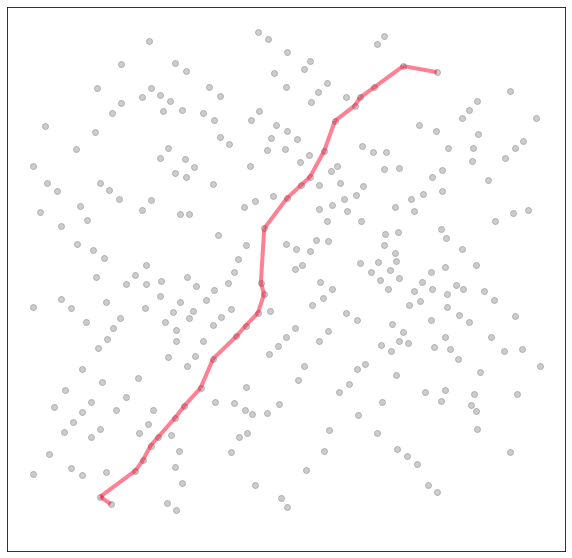

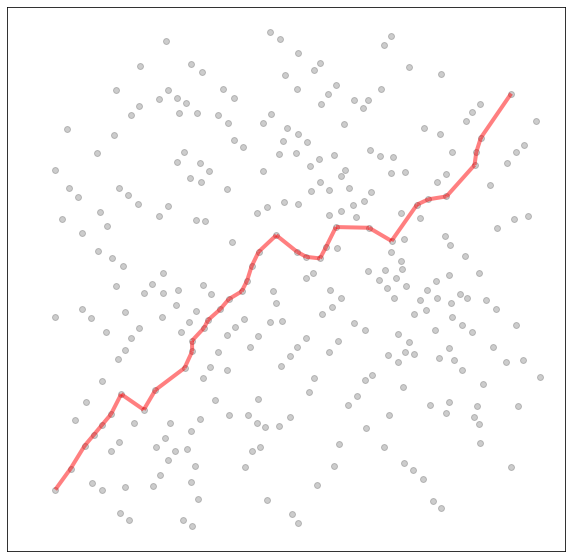

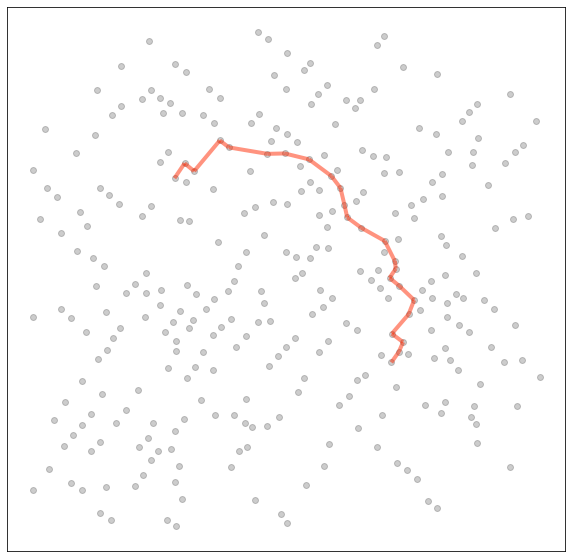

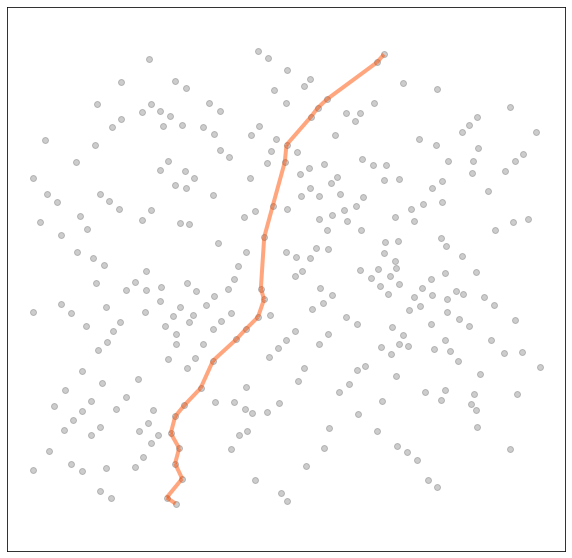

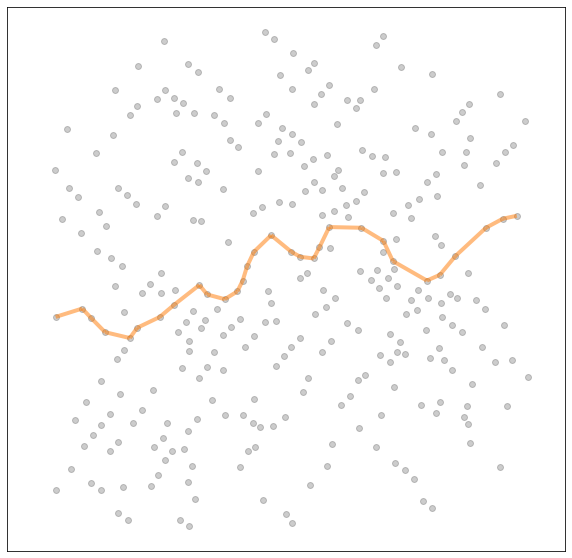

...

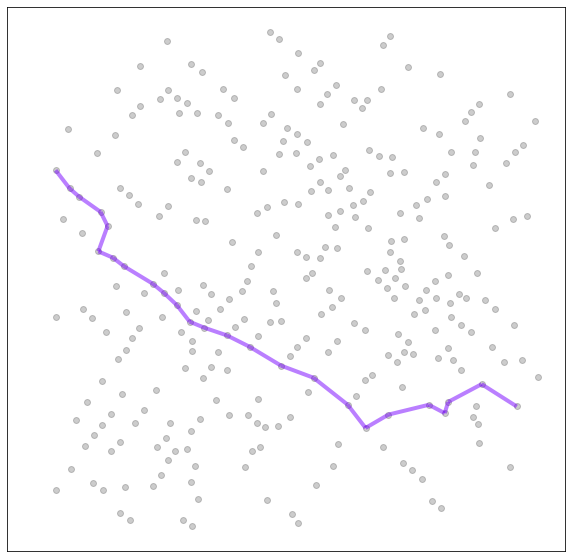

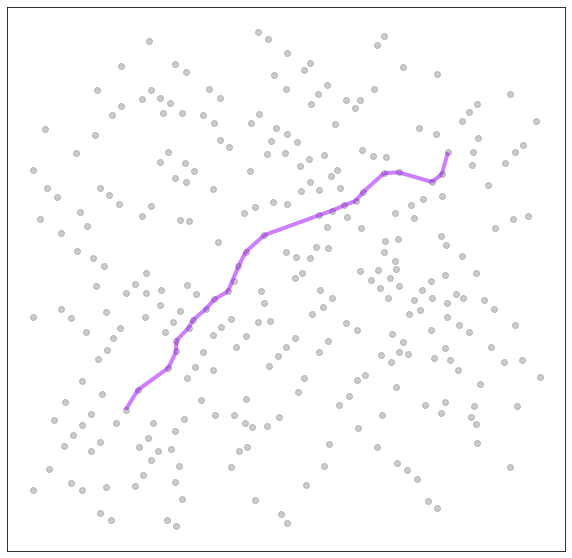

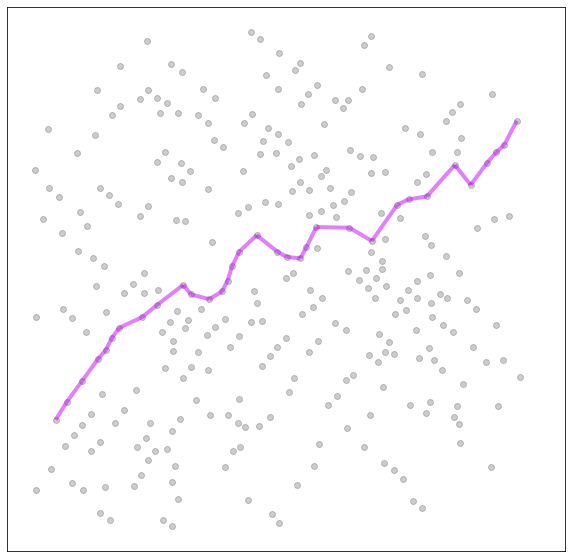

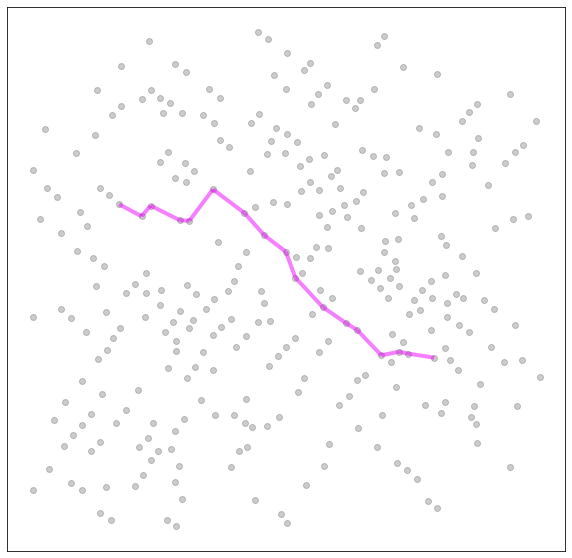

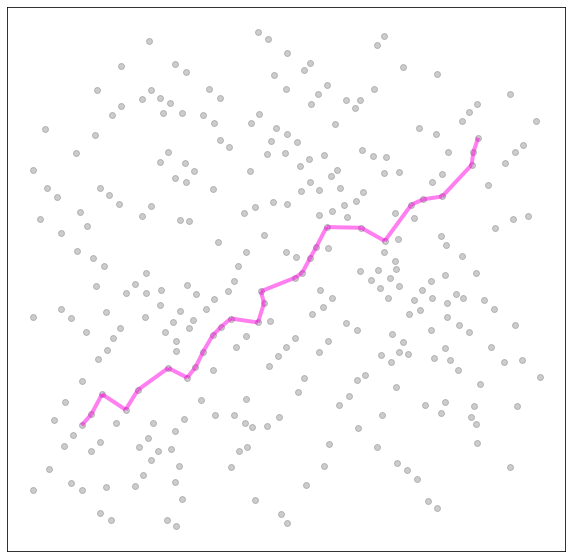

In [69]:
for ctr, edgelist in enumerate(edjs):
    plt.figure(figsize=(10,10))
    plt.scatter(cov_x, cov_y, c='#000000', alpha = 0.2)
#     nx.draw(T, vertexpos, node_size=0, font_size=10)
    nx.draw_networkx_edges(L, pos=vertexpos, edgelist=edgelist, edge_color = cm(ctr/NUM_COLORS), alpha = 0.5, width = 4 ,node_size= 10)
    plt.show()